In [1]:
import pandas as pd
from pathlib import Path

images_dir = Path("/home/project/BCN20000/")

In [3]:
import fastdup

fd = fastdup.create(
    input_dir=images_dir,
    work_dir="fastdup_output",
)

fd.run()

fastdup By Visual Layer, Inc. 2024. All rights reserved.



fastdup By Visual Layer, Inc. 2024. All rights reserved.

A fastdup dataset object was created!

Input directory is set to "/home/project/BCN20000"
Work directory is set to "fastdup_output"

The next steps are:
   1. Analyze your dataset with the .run() function of the dataset object
   2. Interactively explore your data on your local machine with the .explore() function of the dataset object

For more information, use help(fastdup) or check our documentation https://docs.visual-layer.com/docs/getting-started-with-fastdup.



Building index:  33%|███▎      | 1/3 [00:02<00:04,  2.19s/it]

Creating visualization:  67%|██████▋   | 2/3 [02:28<01:26, 86.95s/it]

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done: 100%|██████████| 3/3 [02:40<00:00, 53.45s/it]                  


Analysis complete. Use the .explore() function to interactively explore your data on your local machine.

Alternatively, you can generate HTML-based galleries.
For more information, use help(fastdup) or check our documentation https://docs.visual-layer.com/docs/getting-started-with-fastdup.



0

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Stored similarity visual view in  fastdup_output/galleries/duplicates.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



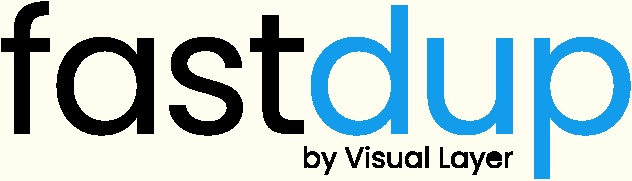
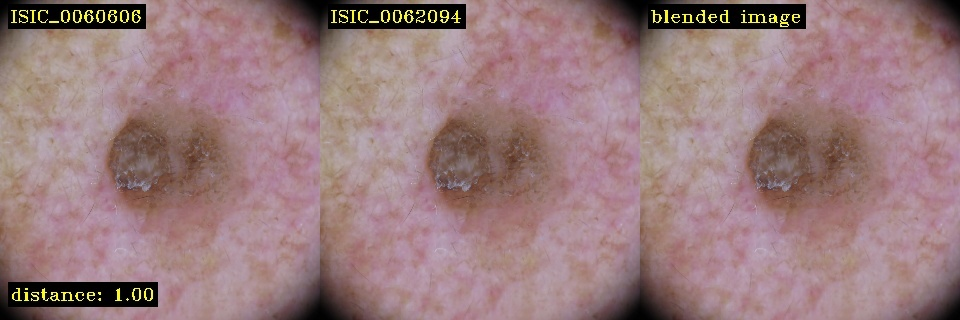
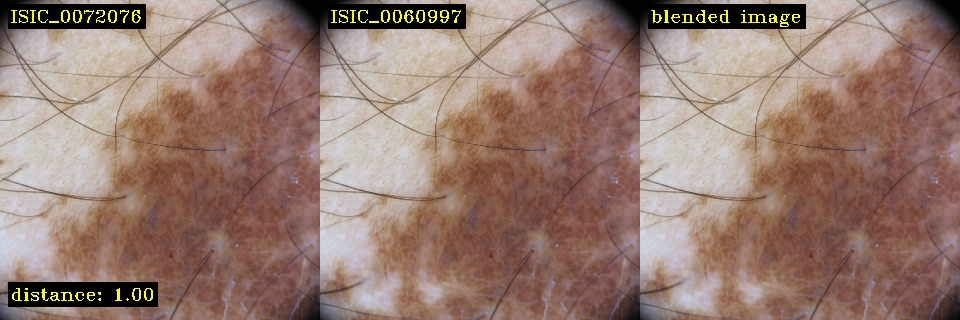
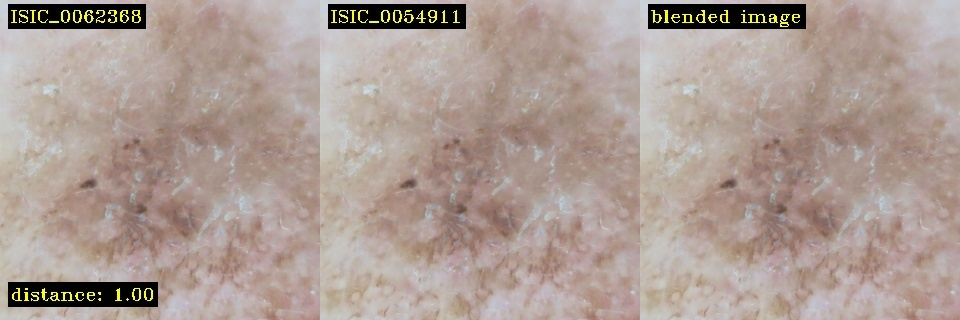
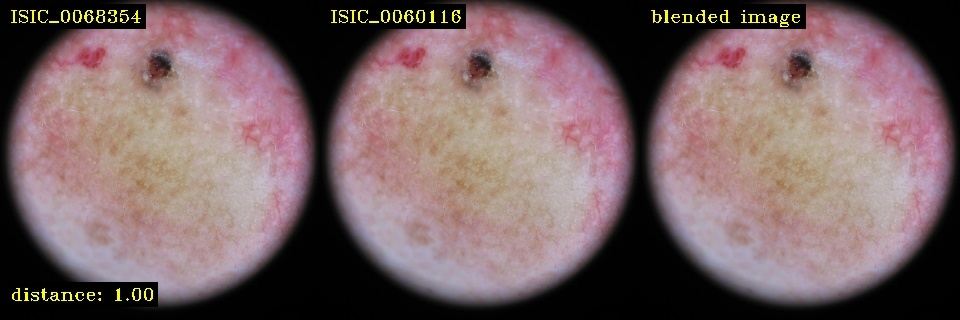
...
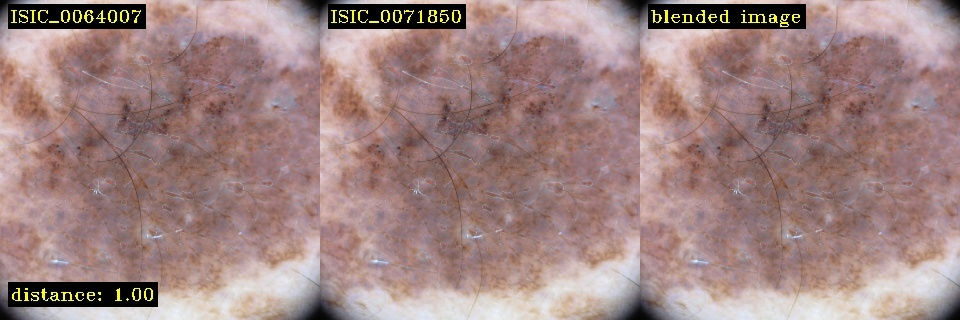
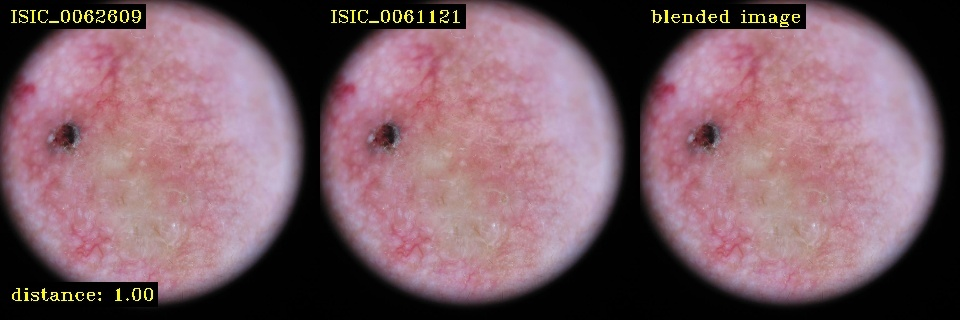
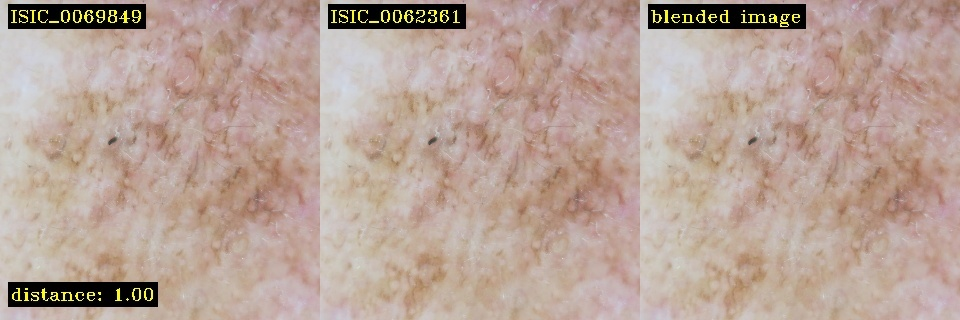
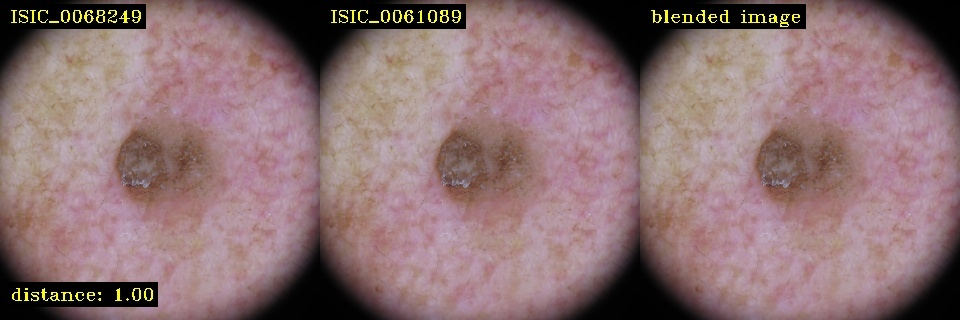
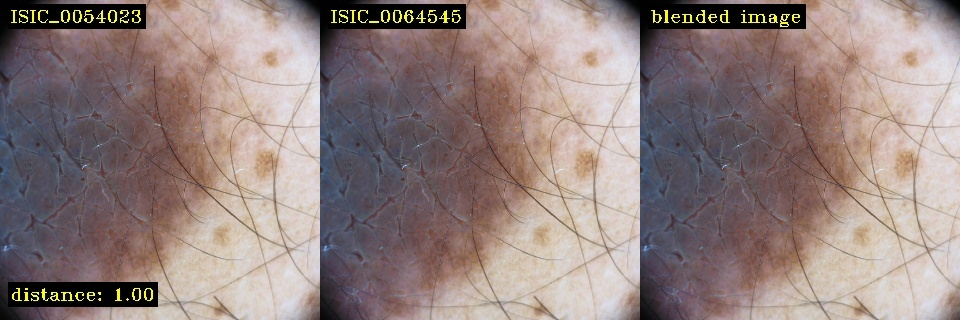

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Stored outliers visual view in  fastdup_output/galleries/outliers.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



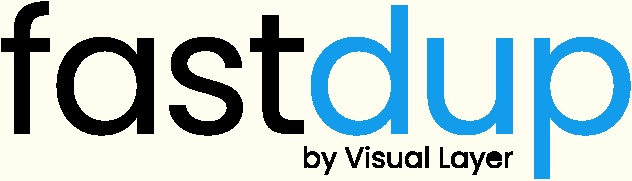
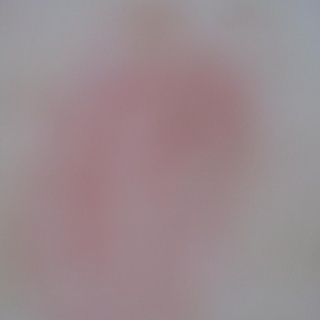
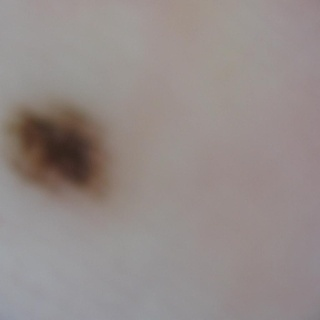
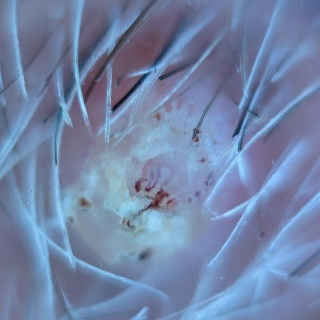
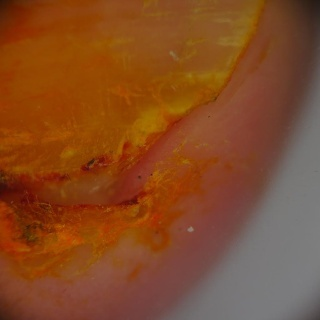
...
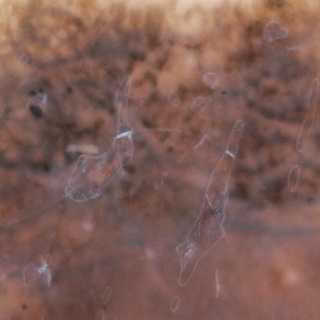
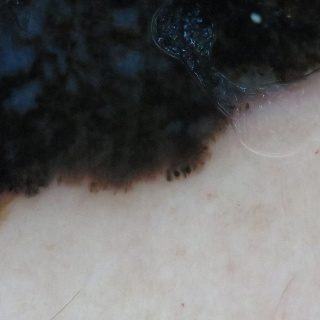
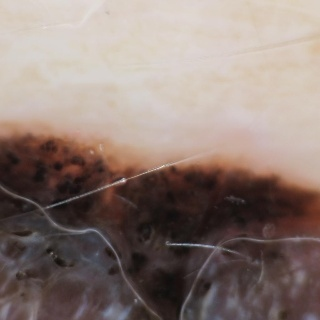
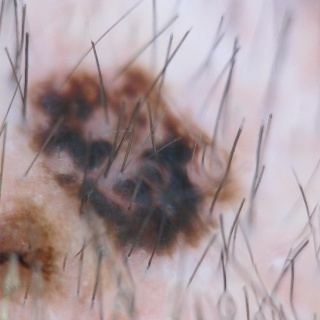
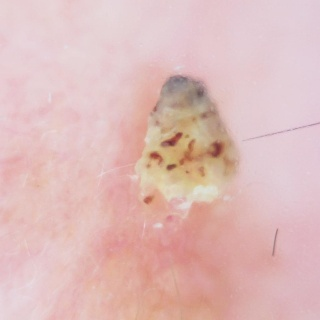

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Finished OK. Components are stored as image files fastdup_output/galleries/components_[index].jpg
Stored components visual view in  fastdup_output/galleries/components.html
Execution time in seconds 4.2
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



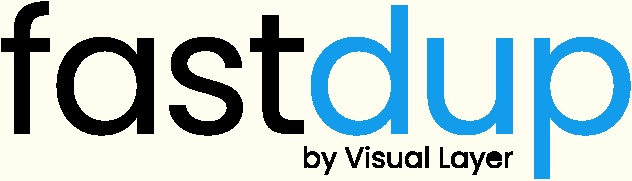
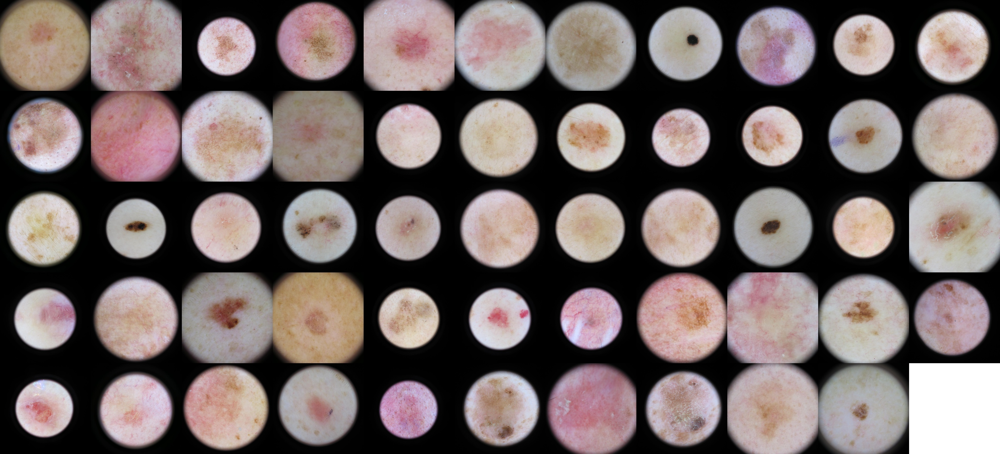
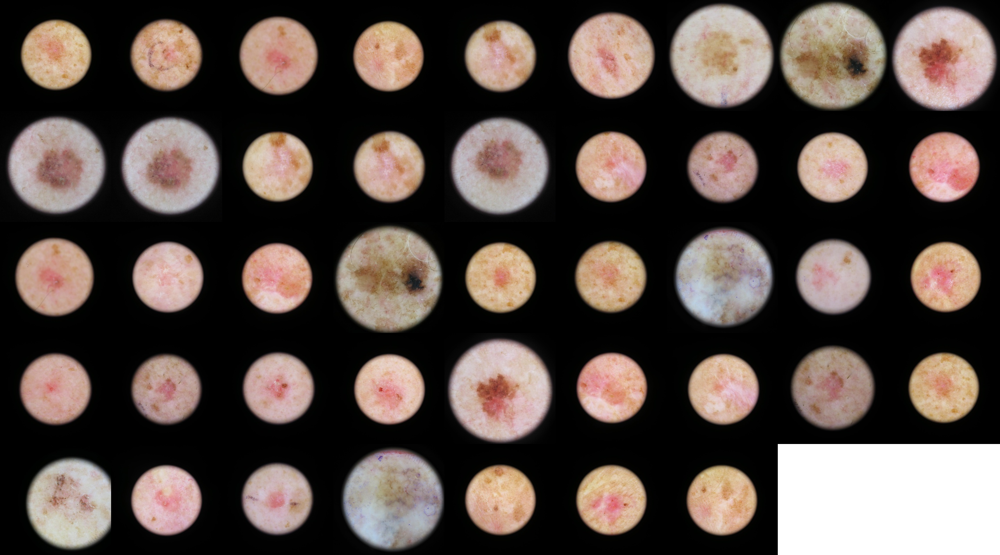
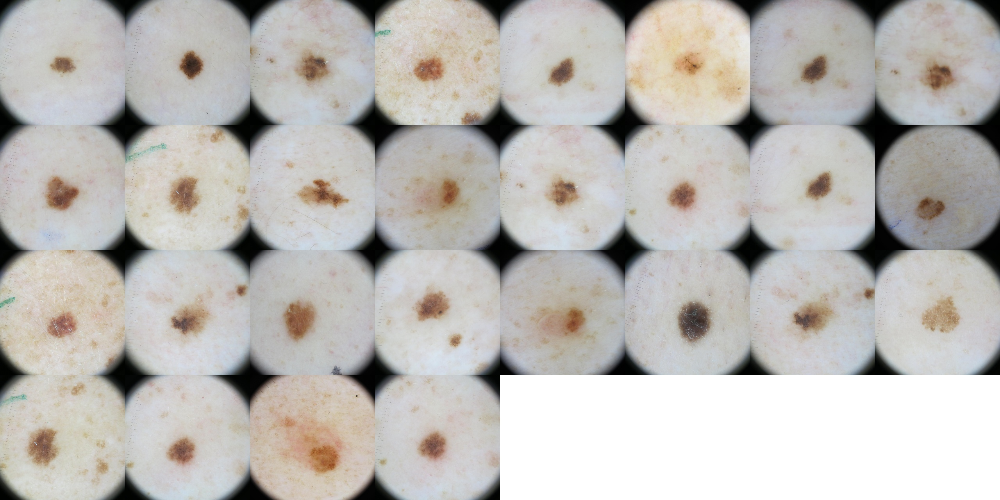
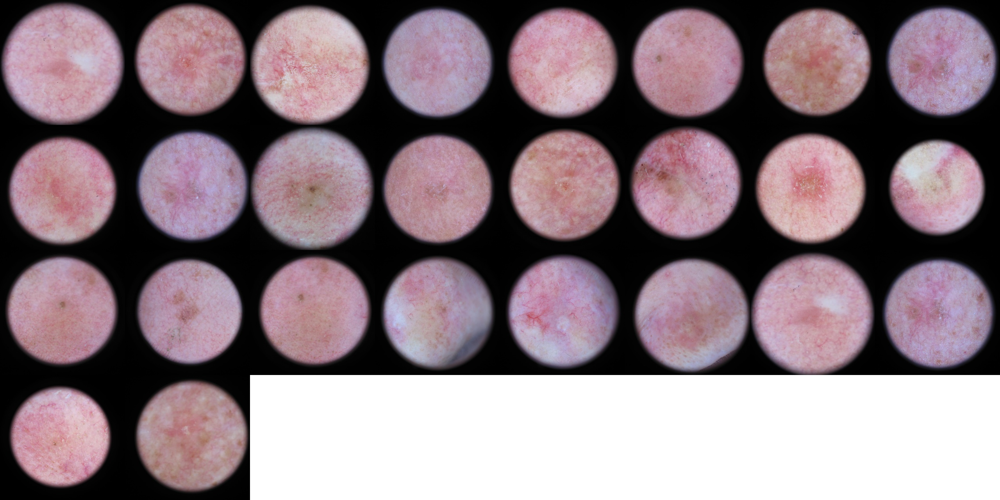
...
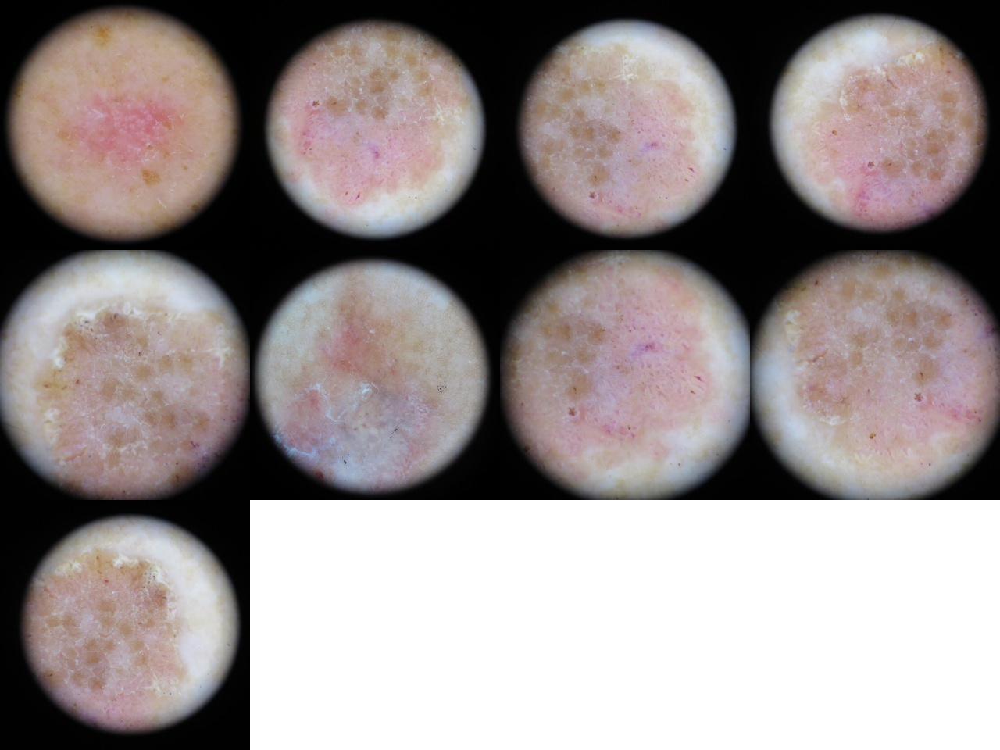
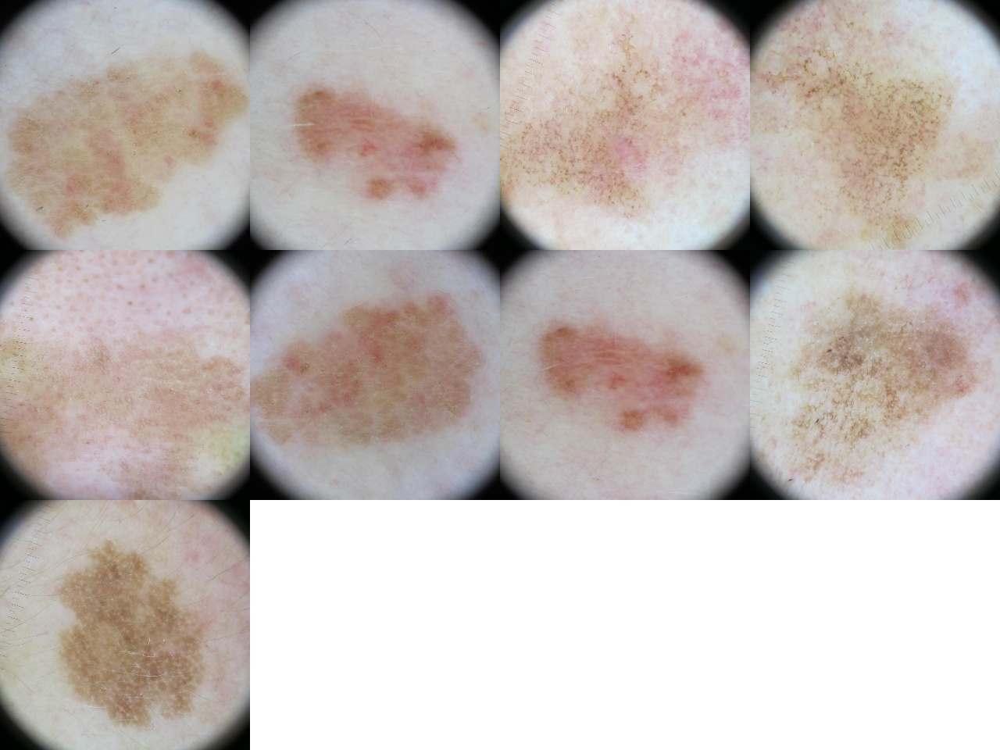
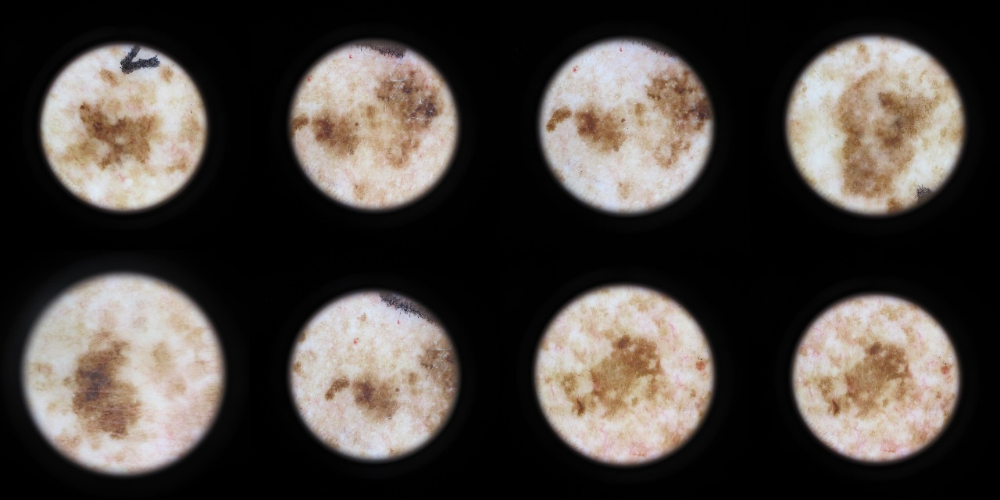
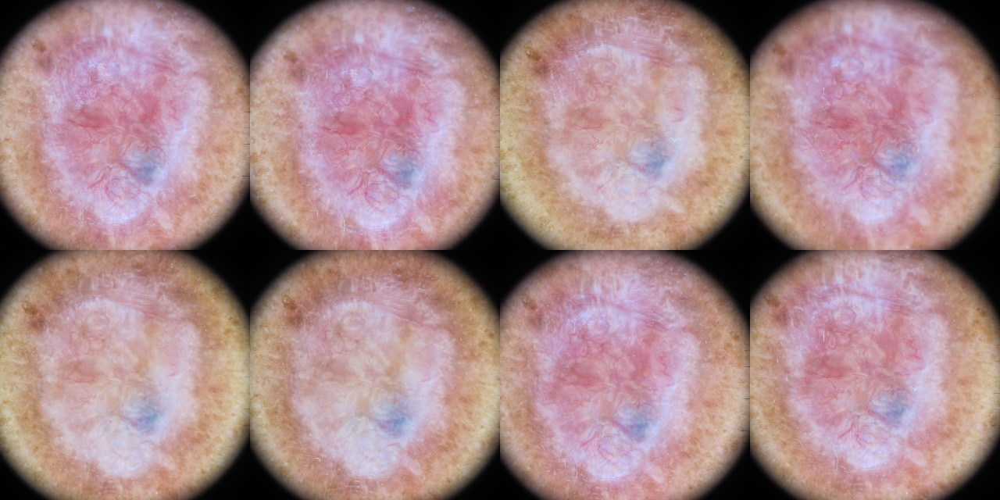
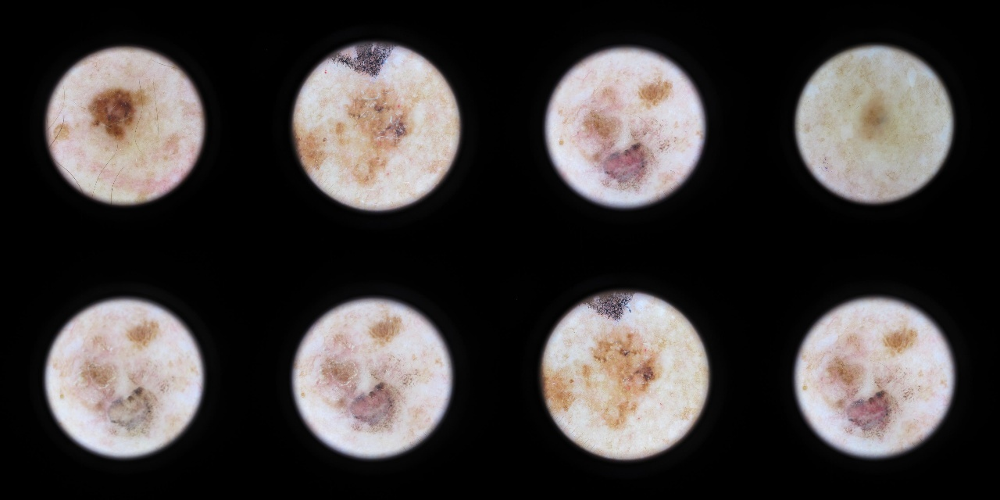

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Stored mean visual view in  fastdup_output/galleries/mean.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



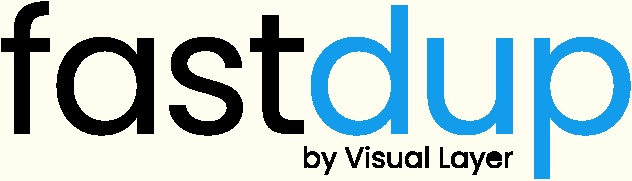
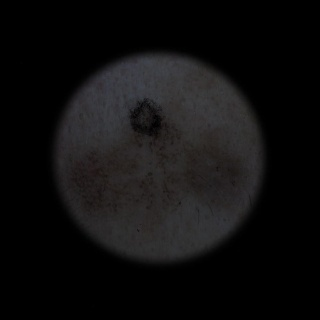
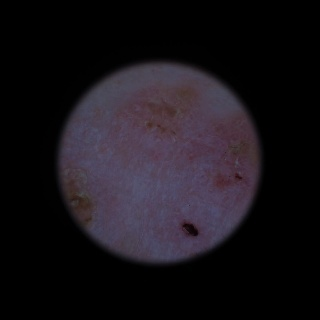
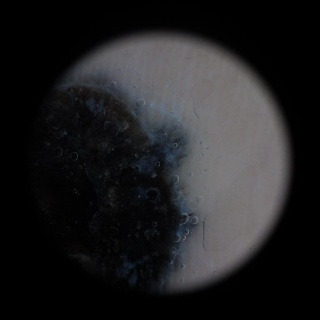
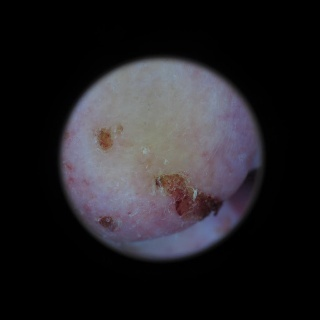
...
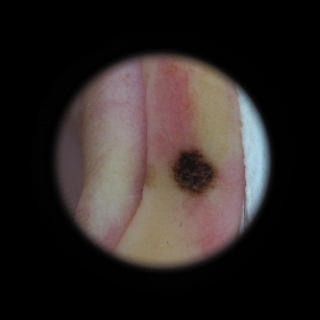
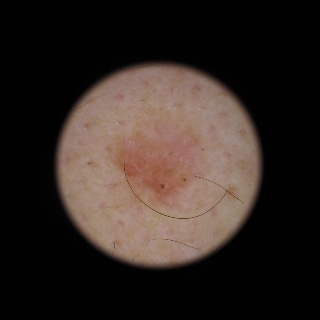
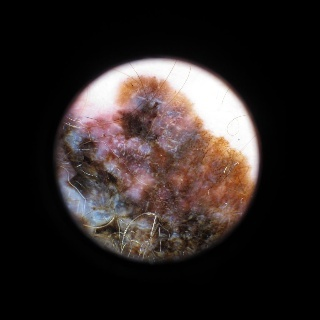
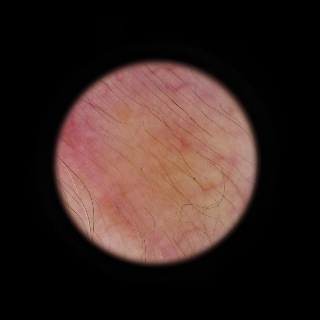
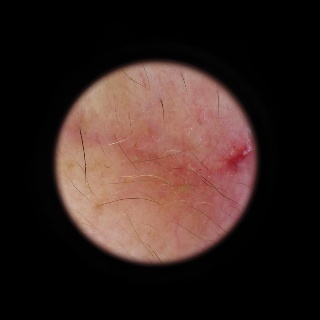

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Stored similar images visual view in  fastdup_output/galleries/similarity.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



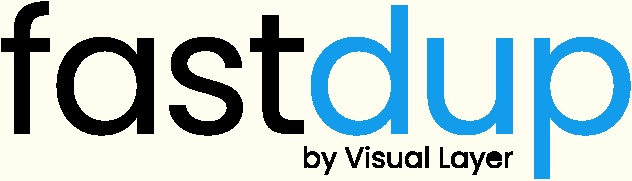
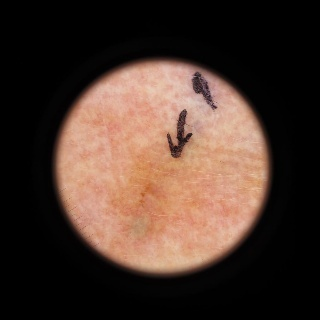
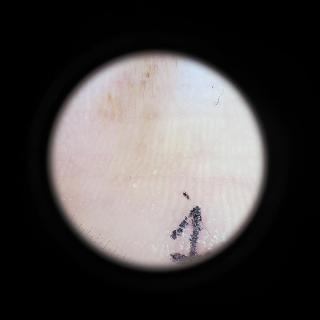
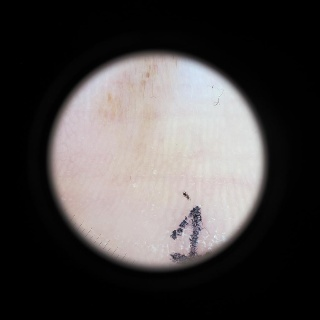
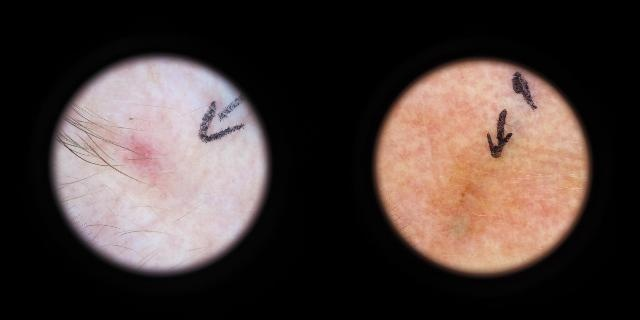
...
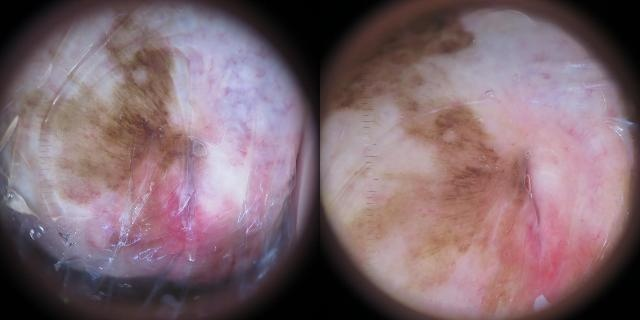
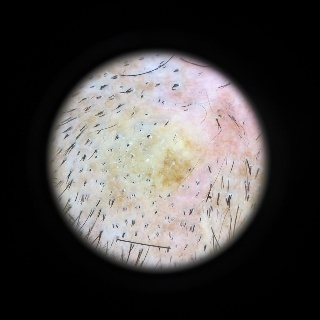
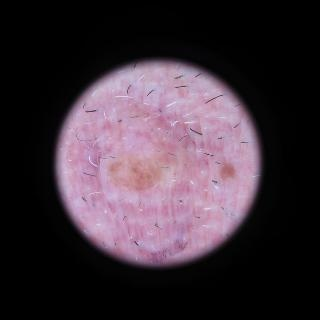
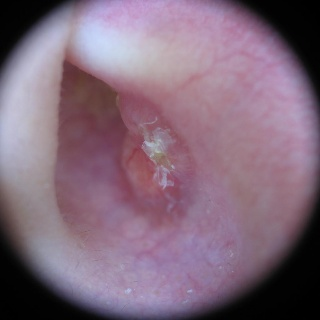
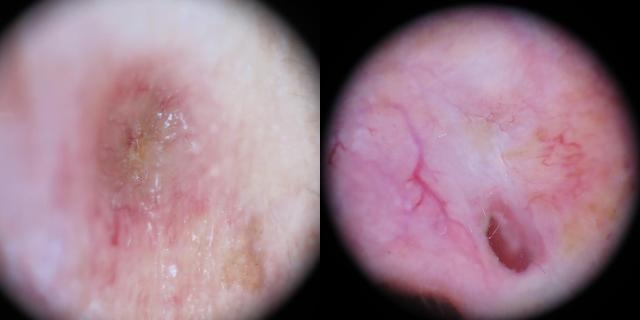

,from,to,distance
14555,/home/project/BCN20000/ISIC_0070607.jpg,[/home/project/BCN20000/ISIC_0054827.jpg],[0.900005]
1169,/home/project/BCN20000/ISIC_0054827.jpg,"[/home/project/BCN20000/ISIC_0070607.jpg, /home/project/BCN20000/ISIC_0067588.jpg]","[0.900005, 0.90344]"
15147,/home/project/BCN20000/ISIC_0071330.jpg,[/home/project/BCN20000/ISIC_0053468.jpg],[0.900012]
12,/home/project/BCN20000/ISIC_0053468.jpg,[/home/project/BCN20000/ISIC_0071330.jpg],[0.900012]
2465,/home/project/BCN20000/ISIC_0056356.jpg,"[/home/project/BCN20000/ISIC_0062803.jpg, /home/project/BCN20000/ISIC_0066078.jpg]","[0.90002, 0.926728]"
...,...,...,...
9224,/home/project/BCN20000/ISIC_0064339.jpg,[/home/project/BCN20000/ISIC_0062983.jpg],[1.0]
7108,/home/project/BCN20000/ISIC_0061861.jpg,[/home/project/BCN20000/ISIC_0054075.jpg],[1.0]
6987,/home/project/BCN20000/ISIC_0061710.jpg,[/home/project/BCN20000/ISIC_0073018.jpg],[1.0]
2779,/home/project/BCN20000/ISIC_0056728.jpg,[/home/project/BCN20000/ISIC_0068343.jpg],[1.0]


In [11]:
fd.vis.duplicates_gallery()    # gallery of duplicates
fd.vis.outliers_gallery()      # gallery of outliers
fd.vis.component_gallery()     # gallery of connected components
fd.vis.stats_gallery()         # gallery of image statistics (e.g. blur, brightness, etc.)
fd.vis.similarity_gallery()    # gallery of similar images

In [4]:
import pandas as pd
from pathlib import Path

df_pairs_path = "/home/project/classifier/work_dir/outliers.csv"
df_map_path   = "/home/project/classifier/work_dir/atrain_features.dat.csv"

df_pairs = pd.read_csv(df_pairs_path)
df_map   = pd.read_csv(df_map_path)


threshold = 0.776758

# 1) строки, где дистанция меньше порога
bad_pairs = df_pairs[df_pairs["distance"] < threshold]

# 2) берём только индексы из колонки from
bad_from_idx = bad_pairs["from"].unique()

print("Будет удалено индексов (from):", len(bad_from_idx))

# 3) переводим индексы -> filename
files_to_delete = df_map[df_map["index"].isin(bad_from_idx)]["filename"].tolist()

print("Будет удалено файлов:", len(files_to_delete))

# 4) удаляем
deleted = 0
missing = 0

for f in files_to_delete:
    p = Path(f)
    if p.exists():
        p.unlink()
        deleted += 1
    else:
        missing += 1

print("Удалено:", deleted)
print("Не найдено:", missing)


Будет удалено индексов (from): 24
Будет удалено файлов: 24
Удалено: 24
Не найдено: 0


In [8]:
import pandas as pd
from pathlib import Path

meta_path = "/home/project/metadata_clean.csv"   # твой исходный файл
dataset_dir = Path("/home/project/BCN20000")  # папка с картинками

df_meta = pd.read_csv(meta_path)

df_meta["filepath"] = df_meta["isic_id"].apply(lambda x: dataset_dir / f"{x}.jpg")
df_meta["exists"] = df_meta["filepath"].apply(lambda p: p.exists())

df_meta_new = df_meta[df_meta["exists"]].drop(columns=["filepath", "exists"]).reset_index(drop=True)
df_meta_removed = df_meta[~df_meta["exists"]].drop(columns=["filepath", "exists"]).reset_index(drop=True)

print("Было:", len(df_meta))
print("Осталось:", len(df_meta_new))
print("Удалено:", len(df_meta_removed))


df_meta_new.to_csv("/home/project/classifier/metadata_new.csv", index=False)
df_meta_removed.to_csv("/home/project/classifier/metadata_removed.csv", index=False)


Было: 15429
Осталось: 15405
Удалено: 24
